# CvT

In [2]:
import pandas as pd
import torch

In [3]:
# Load the data
df = pd.read_csv('./faces/fold_0_data.txt', sep="\t")

In [4]:
print(df.shape)
print(df.columns)
df.head()

(4484, 12)
Index(['user_id', 'original_image', 'face_id', 'age', 'gender', 'x', 'y', 'dx',
       'dy', 'tilt_ang', 'fiducial_yaw_angle', 'fiducial_score'],
      dtype='object')


,user_id,original_image,face_id,age,gender,x,y,dx,dy,tilt_ang,fiducial_yaw_angle,fiducial_score
0,30601258@N03,10399646885_67c7d20df9_o.jpg,1,"(25, 32)",f,0,414,1086,1383,-115,30,17
1,30601258@N03,10424815813_e94629b1ec_o.jpg,2,"(25, 32)",m,301,105,640,641,0,0,94
2,30601258@N03,10437979845_5985be4b26_o.jpg,1,"(25, 32)",f,2395,876,771,771,175,-30,74
3,30601258@N03,10437979845_5985be4b26_o.jpg,3,"(25, 32)",m,752,1255,484,485,180,0,47
4,30601258@N03,11816644924_075c3d8d59_o.jpg,2,"(25, 32)",m,175,80,769,768,-75,0,34


In [5]:
# Load the other dataframes
df1 = pd.read_csv('./faces/fold_1_data.txt', sep="\t")
df2 = pd.read_csv('./faces/fold_2_data.txt', sep="\t")
df3 = pd.read_csv('./faces/fold_3_data.txt', sep="\t")
df4 = pd.read_csv('./faces/fold_4_data.txt', sep="\t")

# Concatenate all the dataframes
df = pd.concat([df, df1, df2, df3, df4]).reset_index(drop=True)

In [6]:
print(df.shape)
print(df.columns)
df.head()

(19370, 12)
Index(['user_id', 'original_image', 'face_id', 'age', 'gender', 'x', 'y', 'dx',
       'dy', 'tilt_ang', 'fiducial_yaw_angle', 'fiducial_score'],
      dtype='object')


,user_id,original_image,face_id,age,gender,x,y,dx,dy,tilt_ang,fiducial_yaw_angle,fiducial_score
0,30601258@N03,10399646885_67c7d20df9_o.jpg,1,"(25, 32)",f,0,414,1086,1383,-115,30,17
1,30601258@N03,10424815813_e94629b1ec_o.jpg,2,"(25, 32)",m,301,105,640,641,0,0,94
2,30601258@N03,10437979845_5985be4b26_o.jpg,1,"(25, 32)",f,2395,876,771,771,175,-30,74
3,30601258@N03,10437979845_5985be4b26_o.jpg,3,"(25, 32)",m,752,1255,484,485,180,0,47
4,30601258@N03,11816644924_075c3d8d59_o.jpg,2,"(25, 32)",m,175,80,769,768,-75,0,34


In [7]:
# Create a new column with the path to the images
df['path'] = df['user_id'] + '/' + "coarse_tilt_aligned_face." + df['face_id'].astype(str) + "." + df['original_image']
df['path'].head()

0    30601258@N03/coarse_tilt_aligned_face.1.103996...
1    30601258@N03/coarse_tilt_aligned_face.2.104248...
2    30601258@N03/coarse_tilt_aligned_face.1.104379...
3    30601258@N03/coarse_tilt_aligned_face.3.104379...
4    30601258@N03/coarse_tilt_aligned_face.2.118166...
Name: path, dtype: object

In [8]:
# drop duplicate images
df = df.drop_duplicates(subset=['path'], keep='first').reset_index(drop=True)

In [9]:
df.shape

(19370, 13)

In [10]:
df['gender'].value_counts()

gender
f    9372
m    8120
u    1099
Name: count, dtype: int64

In [11]:
# drop the rows with u or nan for gender
df = df[(df['gender'] != 'u') & (df['gender'].notnull())]
df['gender'].value_counts()

gender
f    9372
m    8120
Name: count, dtype: int64

In [12]:
# encode gender column as male
df['male'] = df['gender'].apply(lambda x: 1 if x == 'm' else 0)
df['male'].value_counts()

male
0    9372
1    8120
Name: count, dtype: int64

In [13]:
import os
import torch
from torch.utils.data import Dataset
from torchvision import datasets
from torchvision.transforms import ToTensor
import matplotlib.pyplot as plt
from PIL import Image


dim = 224


class ImageDataset(Dataset):
  def __init__(self, annotations_df, img_dir, dim=dim, transform=None, target_transform=None):
    self.annotations_df = annotations_df
    self.img_dir = img_dir
    self.dim = dim
    self.transform = transform
    self.target_transform = target_transform

  def __len__(self):
    return len(self.annotations_df)

  def __getitem__(self, idx):
    img_path = os.path.join(self.img_dir, self.annotations_df.loc[idx, 'path'])
    # read the image and resize
    image = Image.open(img_path).convert("RGB")
    image = image.resize((self.dim, self.dim))
    image = ToTensor()(image)
    label = self.annotations_df.loc[idx, 'male']
    label = torch.tensor(label)
    if self.transform:
        image = self.transform(image, self.dim)
    if self.target_transform:
        label = self.target_transform(label)
    return image, label

In [14]:
from torchvision import transforms

def transform_image(image, dim):
  # data augmentation
  transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.RandomResizedCrop(dim, scale=(0.8, 1.0), ratio=(1.0,1.0)),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
  ])
  return transform(image)

## 10000 datapoints: 8000 Train, 1000 Val, 1000 Test

In [15]:
# sample 10000 images, with an equal number of each gender
df_male = df[df['gender'] == 'm'].sample(n=5000, random_state=23)
df_female = df[df['gender'] == 'f'].sample(n=5000, random_state=23)
df_sampled = pd.concat([df_male, df_female]).reset_index(drop=True)
print(df_sampled['gender'].value_counts())

gender
m    5000
f    5000
Name: count, dtype: int64


In [16]:
# Get train, validation and test sets (80-10-10)
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(df_sampled, test_size=0.2, random_state=23)
val_df, test_df = train_test_split(test_df, test_size=0.5, random_state=23)

# Create the datasets
train_dataset = ImageDataset(train_df.reset_index(drop=True), './faces/', dim=dim, transform=transform_image)
val_dataset = ImageDataset(val_df.reset_index(drop=True), './faces/', dim=dim)
test_dataset = ImageDataset(test_df.reset_index(drop=True), './faces/', dim=dim)

In [17]:
len(train_dataset), len(val_dataset), len(test_dataset)

(8000, 1000, 1000)

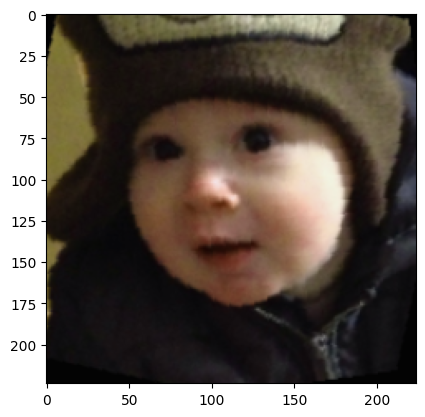

In [18]:
# show an image
image, label = train_dataset[1]
plt.imshow(image.permute(1, 2, 0))
plt.show()

In [19]:
# Define the dataloaders
from torch.utils.data import DataLoader

batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [20]:
labels = ["female", "male"]
label2id, id2label = dict(), dict()
for i, label in enumerate(labels):
    label2id[label] = i
    id2label[i] = label

### Train from scratch

In [22]:
from transformers import CvtConfig, CvtForImageClassification

# Initializing a configuration for CvT microsoft/cvt-13 architecture
config = CvtConfig(num_labels=2)

# Initializing a model (with random weights) from the cvt-13 configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cvt_13 = CvtForImageClassification(config).to(device)

config

CvtConfig {
  "_attn_implementation_autoset": true,
  "attention_drop_rate": [
    0.0,
    0.0,
    0.0
  ],
  "cls_token": [
    false,
    false,
    true
  ],
  "depth": [
    1,
    2,
    10
  ],
  "drop_path_rate": [
    0.0,
    0.0,
    0.1
  ],
  "drop_rate": [
    0.0,
    0.0,
    0.0
  ],
  "embed_dim": [
    64,
    192,
    384
  ],
  "initializer_range": 0.02,
  "kernel_qkv": [
    3,
    3,
    3
  ],
  "layer_norm_eps": 1e-12,
  "mlp_ratio": [
    4.0,
    4.0,
    4.0
  ],
  "model_type": "cvt",
  "num_channels": 3,
  "num_heads": [
    1,
    3,
    6
  ],
  "padding_kv": [
    1,
    1,
    1
  ],
  "padding_q": [
    1,
    1,
    1
  ],
  "patch_padding": [
    2,
    1,
    1
  ],
  "patch_sizes": [
    7,
    3,
    3
  ],
  "patch_stride": [
    4,
    2,
    2
  ],
  "qkv_bias": [
    true,
    true,
    true
  ],
  "qkv_projection_method": [
    "dw_bn",
    "dw_bn",
    "dw_bn"
  ],
  "stride_kv": [
    2,
    2,
    2
  ],
  "stride_q": [
    1,
    1,
   

In [23]:
cvt_13

CvtForImageClassification(
  (cvt): CvtModel(
    (encoder): CvtEncoder(
      (stages): ModuleList(
        (0): CvtStage(
          (embedding): CvtEmbeddings(
            (convolution_embeddings): CvtConvEmbeddings(
              (projection): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(2, 2))
              (normalization): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
            )
            (dropout): Dropout(p=0.0, inplace=False)
          )
          (layers): Sequential(
            (0): CvtLayer(
              (attention): CvtAttention(
                (attention): CvtSelfAttention(
                  (convolution_projection_query): CvtSelfAttentionProjection(
                    (convolution_projection): CvtSelfAttentionConvProjection(
                      (convolution): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64, bias=False)
                      (normalization): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tra

In [24]:
# Check the number of parameters
total_params = sum([param.numel() for param in cvt_13.parameters()])
print(f'{total_params:,} total parameters.')

19,613,250 total parameters.


In [25]:
from transformers import AutoImageProcessor

# Load the image processor
image_processor = AutoImageProcessor.from_pretrained("microsoft/cvt-13")

In [20]:
image_processor

ConvNextImageProcessor {
  "crop_pct": 0.875,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "ConvNextImageProcessor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "shortest_edge": 224
  }
}

In [ ]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(cvt_13.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [24]:
# Train the model
n_epochs = 100

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  cvt_13.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    optimizer.zero_grad()
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  cvt_13.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
      outputs = cvt_13(**inputs).logits
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(cvt_13.state_dict(), 'cvt_13.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

===== Epoch 1 =====
Training Loss: 0.7134, Training Accuracy: 0.5356
Validation Loss: 0.6624, Validation Accuracy: 0.5980
===== Epoch 2 =====
Training Loss: 0.6653, Training Accuracy: 0.5924
Validation Loss: 0.6305, Validation Accuracy: 0.6560
===== Epoch 3 =====
Training Loss: 0.6417, Training Accuracy: 0.6149
Validation Loss: 0.6054, Validation Accuracy: 0.6570
===== Epoch 4 =====
Training Loss: 0.6128, Training Accuracy: 0.6491
Validation Loss: 0.5607, Validation Accuracy: 0.6970
===== Epoch 5 =====
Training Loss: 0.6024, Training Accuracy: 0.6601
Validation Loss: 0.5587, Validation Accuracy: 0.7110
===== Epoch 6 =====
Training Loss: 0.5878, Training Accuracy: 0.6666
Validation Loss: 0.5239, Validation Accuracy: 0.7260
===== Epoch 7 =====
Training Loss: 0.5665, Training Accuracy: 0.6835
Validation Loss: 0.5075, Validation Accuracy: 0.7440
===== Epoch 8 =====
Training Loss: 0.5662, Training Accuracy: 0.6793
Validation Loss: 0.4969, Validation Accuracy: 0.7460
===== Epoch 9 =====
Trai

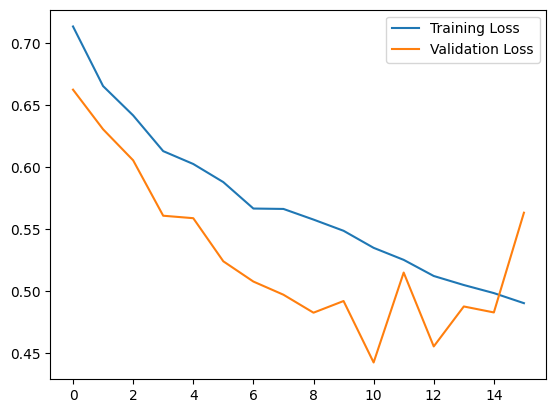

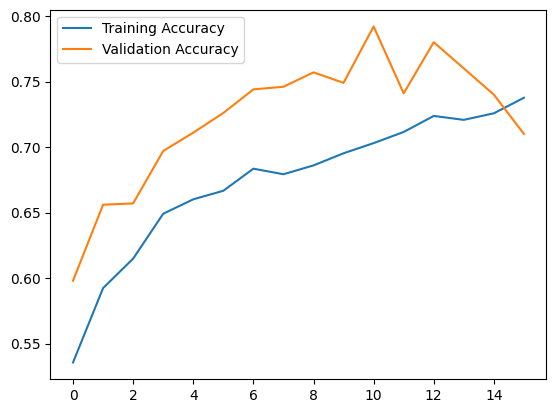

In [25]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()

In [26]:
# Evaluate the model
cvt_13.load_state_dict(torch.load('cvt_13.pth'))
cvt_13.to(device)

cvt_13.eval()
test_accuracy = 0
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    test_accuracy += (outputs.argmax(1) == labels).sum().item()
test_accuracy /= len(test_loader.dataset)
print(f'Test Accuracy: {test_accuracy:.4f}')

C:\Users\waiho\AppData\Local\Temp\ipykernel_9912\207323365.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  cvt_13.load_state_dict(torch.load('cvt_13.pth'))


Test Accuracy: 0.7990


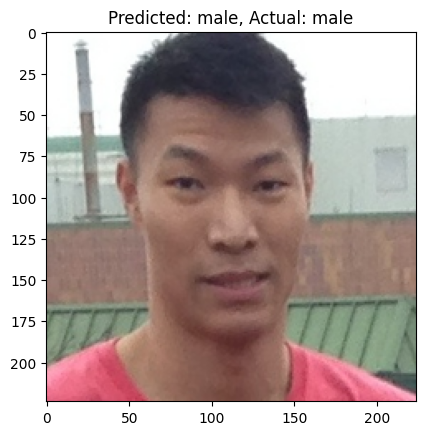

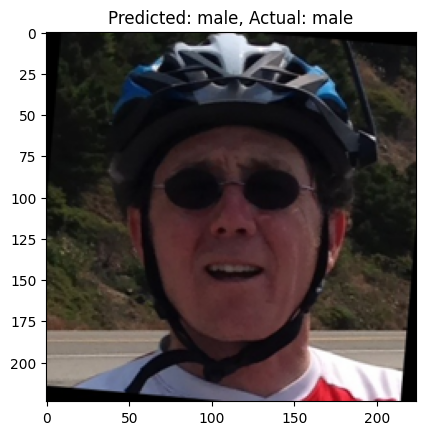

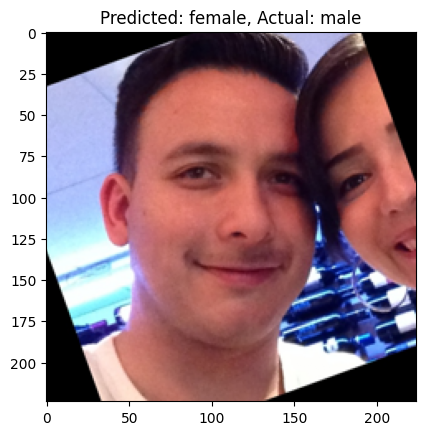

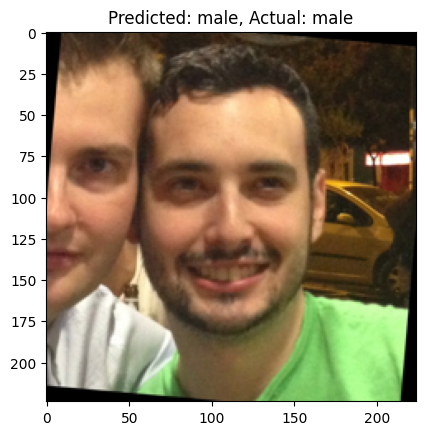

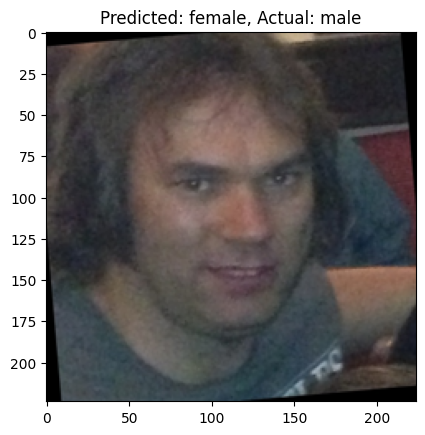

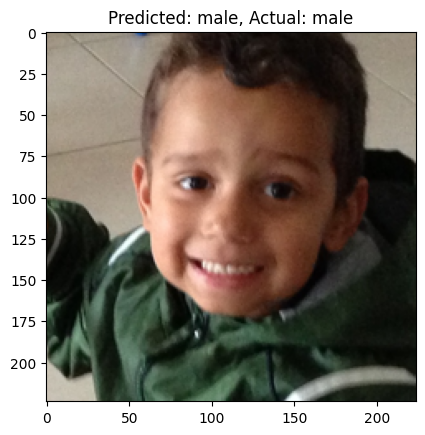

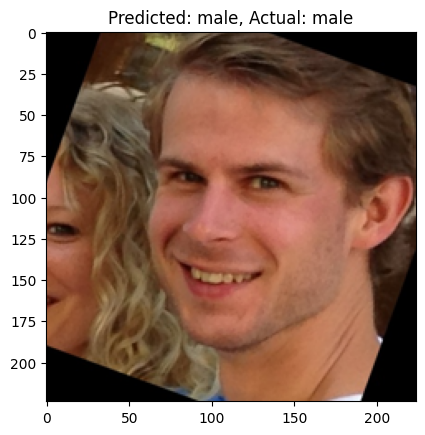

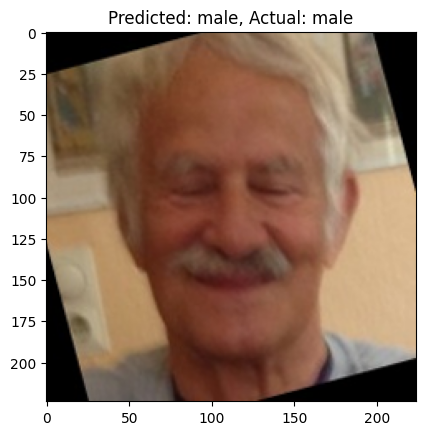

In [31]:
# Show some predictions
cvt_13.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
outputs = cvt_13(**inputs).logits
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

### Transfer Learning

In [ ]:
from transformers import CvtForImageClassification

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cvt_13 = CvtForImageClassification.from_pretrained("microsoft/cvt-13").to(device)


In [18]:
cvt_13

CvtForImageClassification(
  (cvt): CvtModel(
    (encoder): CvtEncoder(
      (stages): ModuleList(
        (0): CvtStage(
          (embedding): CvtEmbeddings(
            (convolution_embeddings): CvtConvEmbeddings(
              (projection): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(2, 2))
              (normalization): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
            )
            (dropout): Dropout(p=0.0, inplace=False)
          )
          (layers): Sequential(
            (0): CvtLayer(
              (attention): CvtAttention(
                (attention): CvtSelfAttention(
                  (convolution_projection_query): CvtSelfAttentionProjection(
                    (convolution_projection): CvtSelfAttentionConvProjection(
                      (convolution): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64, bias=False)
                      (normalization): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tra

In [19]:
# Check the number of parameters
total_params = sum([param.numel() for param in cvt_13.parameters()])
print(f'{total_params:,} total parameters.')

19,997,480 total parameters.


In [20]:
from transformers import AutoImageProcessor

# Load the image processor
image_processor = AutoImageProcessor.from_pretrained("microsoft/cvt-13")

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.48, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [21]:
image_processor

ConvNextImageProcessor {
  "crop_pct": 0.875,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "ConvNextImageProcessor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "shortest_edge": 224
  }
}

In [ ]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(cvt_13.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [23]:
# Train the model
n_epochs = 100

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  cvt_13.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    optimizer.zero_grad()
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  cvt_13.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
      outputs = cvt_13(**inputs).logits
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(cvt_13.state_dict(), 'cvt_13_finetune.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

===== Epoch 1 =====
Training Loss: 1.0474, Training Accuracy: 0.6809
Validation Loss: 0.2379, Validation Accuracy: 0.8990
===== Epoch 2 =====
Training Loss: 0.4932, Training Accuracy: 0.8041
Validation Loss: 0.1971, Validation Accuracy: 0.9250
===== Epoch 3 =====
Training Loss: 0.4343, Training Accuracy: 0.8254
Validation Loss: 0.1460, Validation Accuracy: 0.9450
===== Epoch 4 =====
Training Loss: 0.3959, Training Accuracy: 0.8436
Validation Loss: 0.1886, Validation Accuracy: 0.9250
===== Epoch 5 =====
Training Loss: 0.3675, Training Accuracy: 0.8591
Validation Loss: 0.1149, Validation Accuracy: 0.9630
===== Epoch 6 =====
Training Loss: 0.3388, Training Accuracy: 0.8661
Validation Loss: 0.1295, Validation Accuracy: 0.9600
===== Epoch 7 =====
Training Loss: 0.3082, Training Accuracy: 0.8695
Validation Loss: 0.1339, Validation Accuracy: 0.9570
===== Epoch 8 =====
Training Loss: 0.2965, Training Accuracy: 0.8702
Validation Loss: 0.1386, Validation Accuracy: 0.9560
===== Epoch 9 =====
Trai

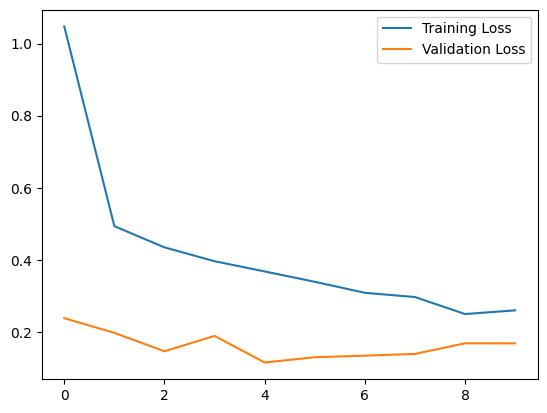

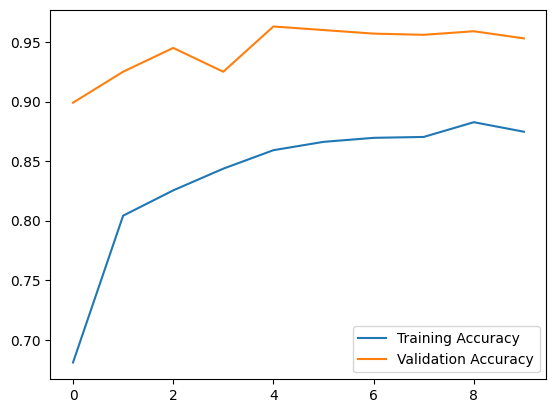

In [24]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()

In [25]:
# Evaluate the model
cvt_13.load_state_dict(torch.load('cvt_13_finetune.pth'))
cvt_13.to(device)

cvt_13.eval()
test_accuracy = 0
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    test_accuracy += (outputs.argmax(1) == labels).sum().item()
test_accuracy /= len(test_loader.dataset)
print(f'Test Accuracy: {test_accuracy:.4f}')

C:\Users\waiho\AppData\Local\Temp\ipykernel_21960\229440522.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  cvt_13.load_state_dict(torch.load('cvt_13_finetune.pth'))


Test Accuracy: 0.9520


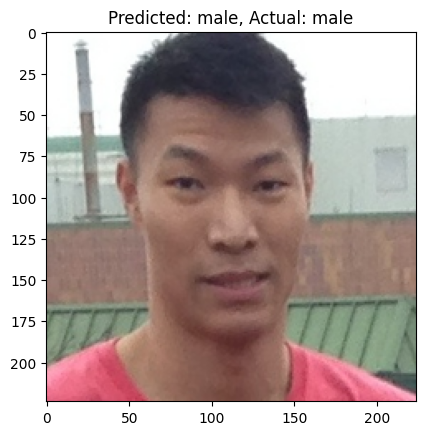

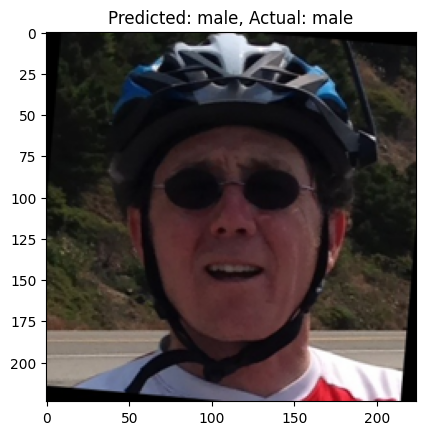

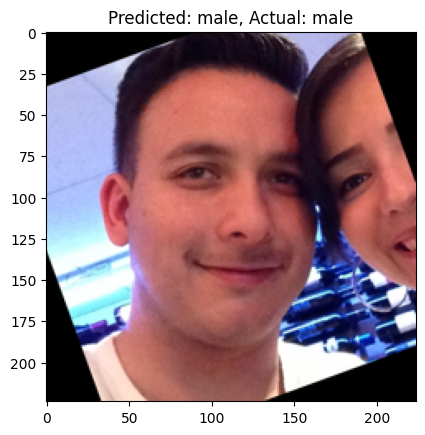

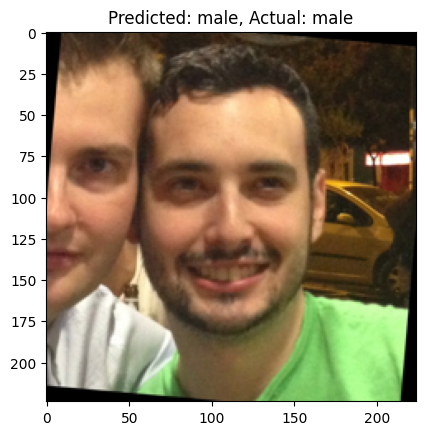

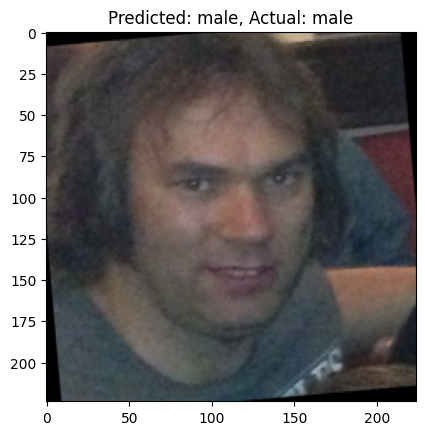

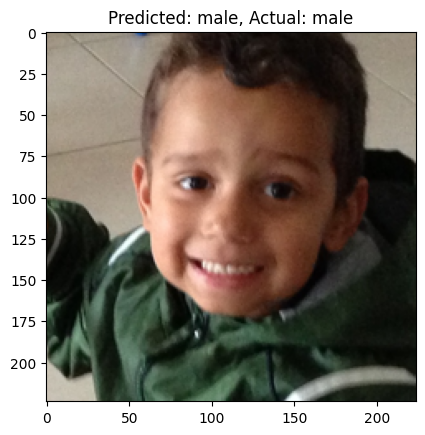

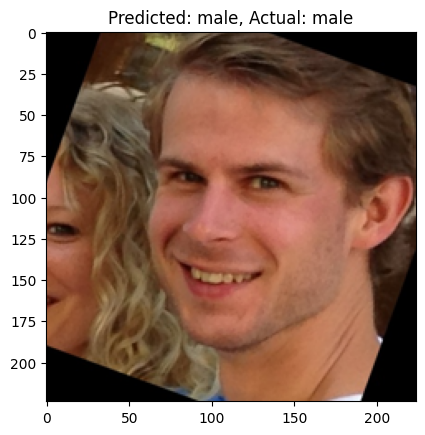

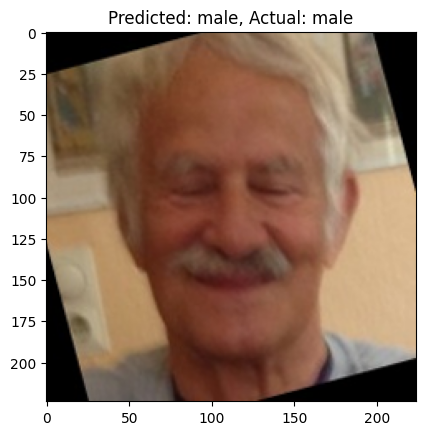

In [26]:
# Show some predictions
cvt_13.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
outputs = cvt_13(**inputs).logits
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

## Less Training Data (4000 Train, 500 Val, Same 1000 Test data)

In [21]:
# remove the 1000 test images from the dataset
df_filtered = df[~df['path'].isin(test_df['path'])].reset_index(drop=True)

# sample 4500 images, with an equal number of each gender for train set
df_male = df_filtered[df_filtered['gender'] == 'm'].sample(n=2250, random_state=23)
df_female = df_filtered[df_filtered['gender'] == 'f'].sample(n=2250, random_state=23)
df_sampled = pd.concat([df_male, df_female]).reset_index(drop=True)
print(df_sampled['gender'].value_counts())

gender
m    2250
f    2250
Name: count, dtype: int64


In [22]:
# Get train and validation (80-10-10)
from sklearn.model_selection import train_test_split
train_df, val_df = train_test_split(df_sampled, test_size=500, random_state=23)

# Create the datasets
train_dataset = ImageDataset(train_df.reset_index(drop=True), './faces/', dim=dim, transform=transform_image)
val_dataset = ImageDataset(val_df.reset_index(drop=True), './faces/', dim=dim)
test_dataset = ImageDataset(test_df.reset_index(drop=True), './faces/', dim=dim)

In [23]:
len(train_dataset), len(val_dataset), len(test_dataset)

(4000, 500, 1000)

In [24]:
# Define the dataloaders
from torch.utils.data import DataLoader

batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [25]:
labels = ["female", "male"]
label2id, id2label = dict(), dict()
for i, label in enumerate(labels):
    label2id[label] = i
    id2label[i] = label

### Train from scratch

In [27]:
from transformers import CvtConfig, CvtForImageClassification

# Initializing a configuration for CvT microsoft/cvt-13 architecture
config = CvtConfig(num_labels=2)

# Initializing a model (with random weights) from the cvt-13 configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cvt_13 = CvtForImageClassification(config).to(device)

config

CvtConfig {
  "_attn_implementation_autoset": true,
  "attention_drop_rate": [
    0.0,
    0.0,
    0.0
  ],
  "cls_token": [
    false,
    false,
    true
  ],
  "depth": [
    1,
    2,
    10
  ],
  "drop_path_rate": [
    0.0,
    0.0,
    0.1
  ],
  "drop_rate": [
    0.0,
    0.0,
    0.0
  ],
  "embed_dim": [
    64,
    192,
    384
  ],
  "initializer_range": 0.02,
  "kernel_qkv": [
    3,
    3,
    3
  ],
  "layer_norm_eps": 1e-12,
  "mlp_ratio": [
    4.0,
    4.0,
    4.0
  ],
  "model_type": "cvt",
  "num_channels": 3,
  "num_heads": [
    1,
    3,
    6
  ],
  "padding_kv": [
    1,
    1,
    1
  ],
  "padding_q": [
    1,
    1,
    1
  ],
  "patch_padding": [
    2,
    1,
    1
  ],
  "patch_sizes": [
    7,
    3,
    3
  ],
  "patch_stride": [
    4,
    2,
    2
  ],
  "qkv_bias": [
    true,
    true,
    true
  ],
  "qkv_projection_method": [
    "dw_bn",
    "dw_bn",
    "dw_bn"
  ],
  "stride_kv": [
    2,
    2,
    2
  ],
  "stride_q": [
    1,
    1,
   

In [28]:
cvt_13

CvtForImageClassification(
  (cvt): CvtModel(
    (encoder): CvtEncoder(
      (stages): ModuleList(
        (0): CvtStage(
          (embedding): CvtEmbeddings(
            (convolution_embeddings): CvtConvEmbeddings(
              (projection): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(2, 2))
              (normalization): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
            )
            (dropout): Dropout(p=0.0, inplace=False)
          )
          (layers): Sequential(
            (0): CvtLayer(
              (attention): CvtAttention(
                (attention): CvtSelfAttention(
                  (convolution_projection_query): CvtSelfAttentionProjection(
                    (convolution_projection): CvtSelfAttentionConvProjection(
                      (convolution): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64, bias=False)
                      (normalization): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tra

In [29]:
# Check the number of parameters
total_params = sum([param.numel() for param in cvt_13.parameters()])
print(f'{total_params:,} total parameters.')

19,613,250 total parameters.


In [30]:
from transformers import AutoImageProcessor

# Load the image processor
image_processor = AutoImageProcessor.from_pretrained("microsoft/cvt-13")

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.48, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [31]:
image_processor

ConvNextImageProcessor {
  "crop_pct": 0.875,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "ConvNextImageProcessor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "shortest_edge": 224
  }
}

In [32]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(cvt_13.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [33]:
# Train the model
n_epochs = 100

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  cvt_13.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    optimizer.zero_grad()
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  cvt_13.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
      outputs = cvt_13(**inputs).logits
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(cvt_13.state_dict(), 'cvt_13_s_data.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

===== Epoch 1 =====
Training Loss: 0.7229, Training Accuracy: 0.5192
Validation Loss: 0.6884, Validation Accuracy: 0.5580
===== Epoch 2 =====
Training Loss: 0.6853, Training Accuracy: 0.5645
Validation Loss: 0.6426, Validation Accuracy: 0.6140
===== Epoch 3 =====
Training Loss: 0.6756, Training Accuracy: 0.5705
Validation Loss: 0.6489, Validation Accuracy: 0.6420
===== Epoch 4 =====
Training Loss: 0.6729, Training Accuracy: 0.5930
Validation Loss: 0.6452, Validation Accuracy: 0.6100
===== Epoch 5 =====
Training Loss: 0.6839, Training Accuracy: 0.5567
Validation Loss: 0.6648, Validation Accuracy: 0.5920
===== Epoch 6 =====
Training Loss: 0.6582, Training Accuracy: 0.5995
Validation Loss: 0.6352, Validation Accuracy: 0.6300
===== Epoch 7 =====
Training Loss: 0.6449, Training Accuracy: 0.6160
Validation Loss: 0.6186, Validation Accuracy: 0.6400
===== Epoch 8 =====
Training Loss: 0.6339, Training Accuracy: 0.6245
Validation Loss: 0.6116, Validation Accuracy: 0.6400
===== Epoch 9 =====
Trai

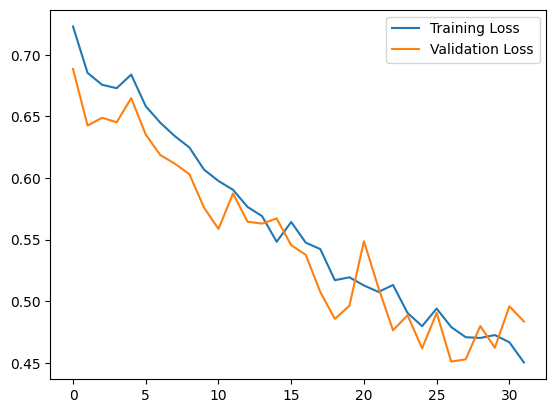

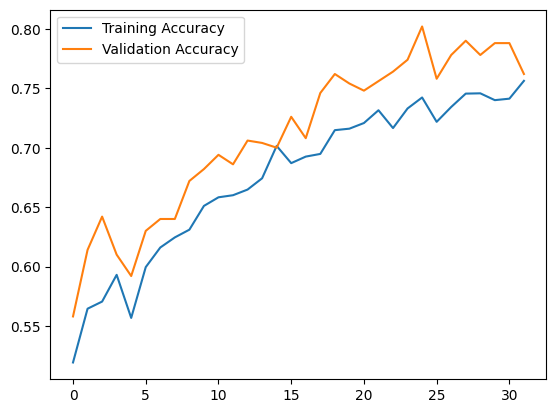

In [34]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()

In [35]:
# Evaluate the model
cvt_13.load_state_dict(torch.load('cvt_13_s_data.pth'))
cvt_13.to(device)

cvt_13.eval()
test_accuracy = 0
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    test_accuracy += (outputs.argmax(1) == labels).sum().item()
test_accuracy /= len(test_loader.dataset)
print(f'Test Accuracy: {test_accuracy:.4f}')

C:\Users\waiho\AppData\Local\Temp\ipykernel_19588\2648041204.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  cvt_13.load_state_dict(torch.load('cvt_13_s_data.pth'))


Test Accuracy: 0.7960


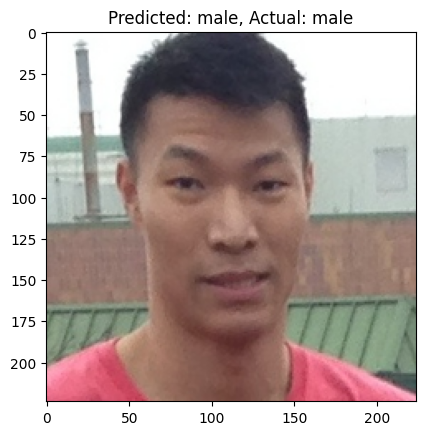

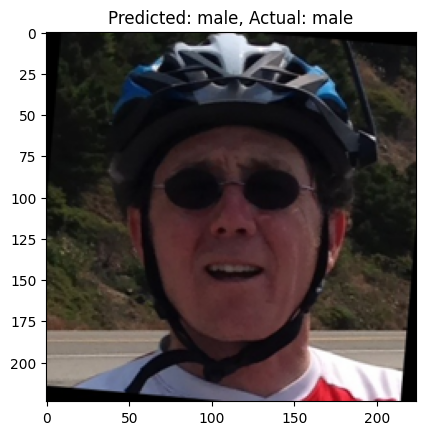

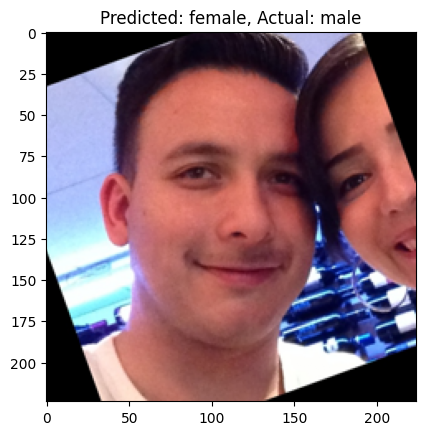

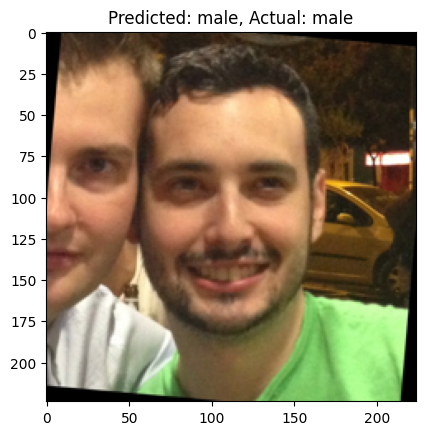

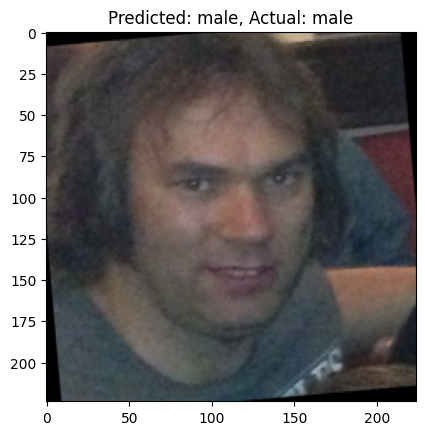

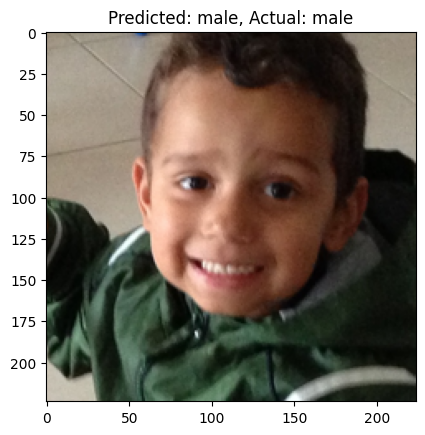

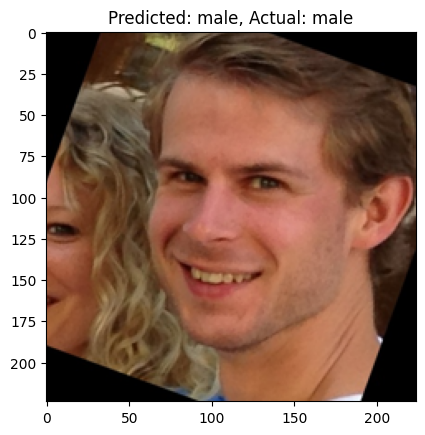

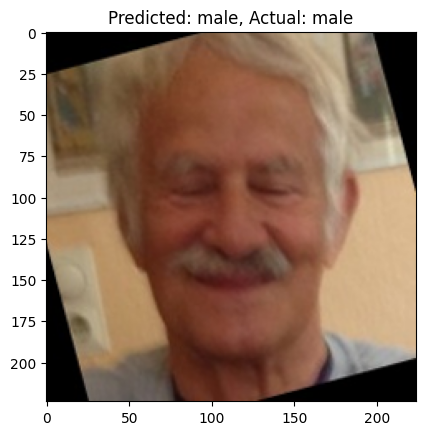

In [36]:
# Show some predictions
cvt_13.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
outputs = cvt_13(**inputs).logits
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

### Transfer Learning

In [26]:
from transformers import CvtForImageClassification

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cvt_13 = CvtForImageClassification.from_pretrained("microsoft/cvt-13").to(device)


In [27]:
cvt_13

CvtForImageClassification(
  (cvt): CvtModel(
    (encoder): CvtEncoder(
      (stages): ModuleList(
        (0): CvtStage(
          (embedding): CvtEmbeddings(
            (convolution_embeddings): CvtConvEmbeddings(
              (projection): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(2, 2))
              (normalization): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
            )
            (dropout): Dropout(p=0.0, inplace=False)
          )
          (layers): Sequential(
            (0): CvtLayer(
              (attention): CvtAttention(
                (attention): CvtSelfAttention(
                  (convolution_projection_query): CvtSelfAttentionProjection(
                    (convolution_projection): CvtSelfAttentionConvProjection(
                      (convolution): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64, bias=False)
                      (normalization): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tra

In [28]:
# Check the number of parameters
total_params = sum([param.numel() for param in cvt_13.parameters()])
print(f'{total_params:,} total parameters.')

19,997,480 total parameters.


In [29]:
from transformers import AutoImageProcessor

# Load the image processor
image_processor = AutoImageProcessor.from_pretrained("microsoft/cvt-13")

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.48, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [30]:
image_processor

ConvNextImageProcessor {
  "crop_pct": 0.875,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "ConvNextImageProcessor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "shortest_edge": 224
  }
}

In [31]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(cvt_13.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [32]:
# Train the model
n_epochs = 100

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  cvt_13.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    optimizer.zero_grad()
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  cvt_13.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
      outputs = cvt_13(**inputs).logits
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(cvt_13.state_dict(), 'cvt_13_finetune_s_data.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

===== Epoch 1 =====
Training Loss: 1.5618, Training Accuracy: 0.6008
Validation Loss: 0.3948, Validation Accuracy: 0.8240
===== Epoch 2 =====
Training Loss: 0.5930, Training Accuracy: 0.7628
Validation Loss: 0.2980, Validation Accuracy: 0.8840
===== Epoch 3 =====
Training Loss: 0.5046, Training Accuracy: 0.7907
Validation Loss: 0.3049, Validation Accuracy: 0.8800
===== Epoch 4 =====
Training Loss: 0.4244, Training Accuracy: 0.8185
Validation Loss: 0.2163, Validation Accuracy: 0.9120
===== Epoch 5 =====
Training Loss: 0.4321, Training Accuracy: 0.8305
Validation Loss: 0.2814, Validation Accuracy: 0.9100
===== Epoch 6 =====
Training Loss: 0.4288, Training Accuracy: 0.8345
Validation Loss: 0.2557, Validation Accuracy: 0.9140
===== Epoch 7 =====
Training Loss: 0.3666, Training Accuracy: 0.8580
Validation Loss: 0.1930, Validation Accuracy: 0.9460
===== Epoch 8 =====
Training Loss: 0.3592, Training Accuracy: 0.8582
Validation Loss: 0.2347, Validation Accuracy: 0.9320
===== Epoch 9 =====
Trai

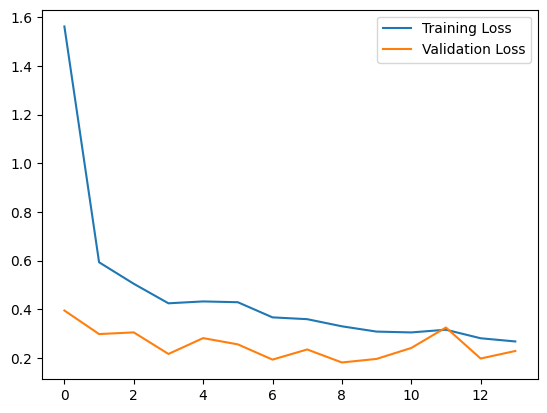

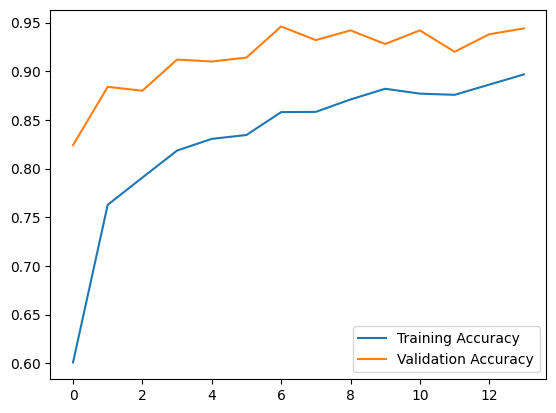

In [33]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()

In [34]:
# Evaluate the model
cvt_13.load_state_dict(torch.load('cvt_13_finetune_s_data.pth'))
cvt_13.to(device)

cvt_13.eval()
test_accuracy = 0
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    test_accuracy += (outputs.argmax(1) == labels).sum().item()
test_accuracy /= len(test_loader.dataset)
print(f'Test Accuracy: {test_accuracy:.4f}')

C:\Users\waiho\AppData\Local\Temp\ipykernel_7232\1950407454.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  cvt_13.load_state_dict(torch.load('cvt_13_finetune_s_data.pth

Test Accuracy: 0.9430


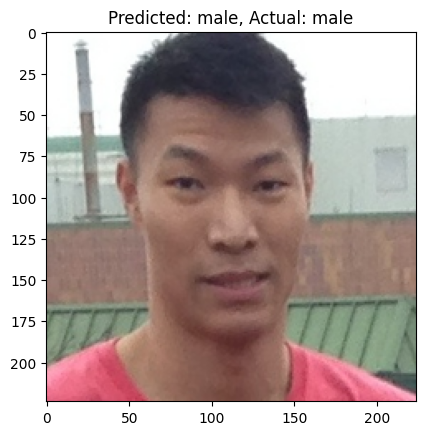

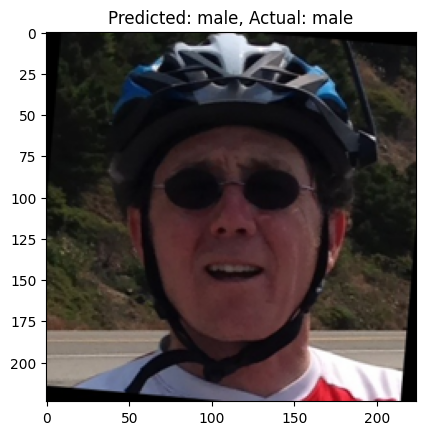

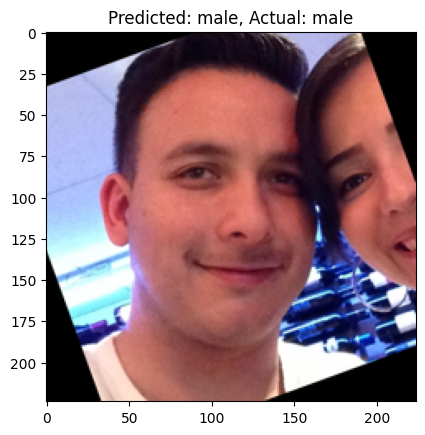

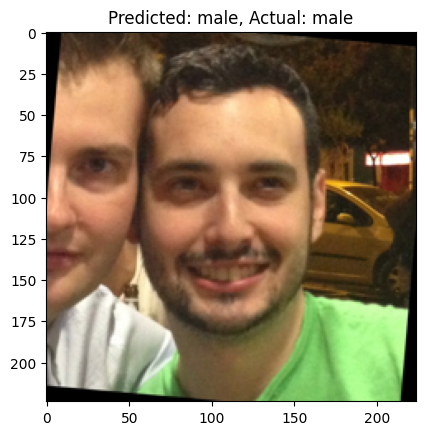

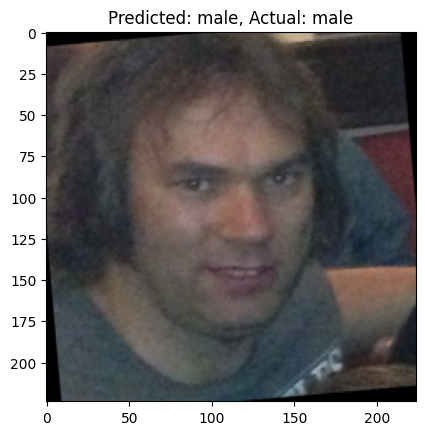

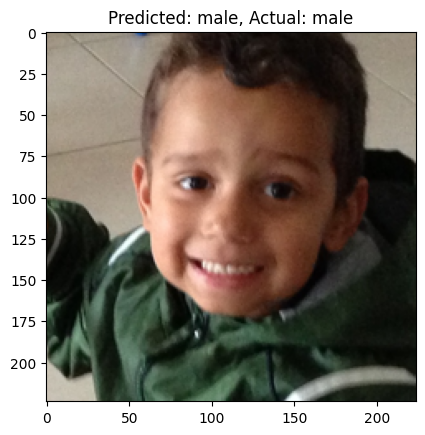

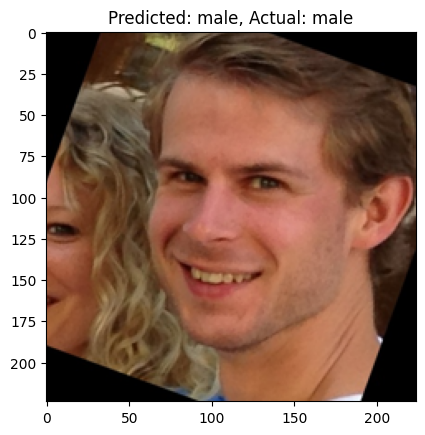

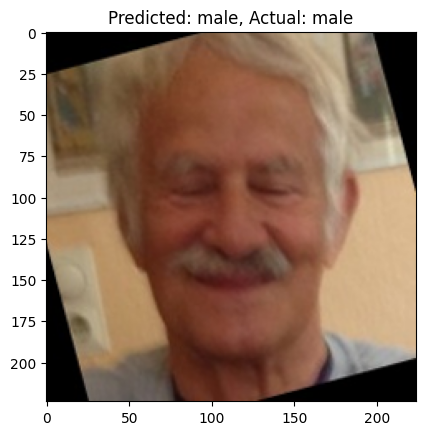

In [35]:
# Show some predictions
cvt_13.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
outputs = cvt_13(**inputs).logits
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

## More Training Data (12000 Train, 1500 Val, Same 1000 Test data)

In [20]:
# remove the 1000 test images from the dataset
df_filtered = df[~df['path'].isin(test_df['path'])].reset_index(drop=True)

# sample 13500 images, with an equal number of each gender for train set
df_male = df_filtered[df_filtered['gender'] == 'm'].sample(n=6750, random_state=23)
df_female = df_filtered[df_filtered['gender'] == 'f'].sample(n=6750, random_state=23)
df_sampled = pd.concat([df_male, df_female]).reset_index(drop=True)
print(df_sampled['gender'].value_counts())

gender
m    6750
f    6750
Name: count, dtype: int64


In [21]:
# Get train, validation and test sets (80-10-10)
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(df_sampled, test_size=0.2, random_state=23)
val_df, test_df = train_test_split(test_df, test_size=0.5, random_state=23)

# Create the datasets
train_dataset = ImageDataset(train_df.reset_index(drop=True), './faces/', dim=dim, transform=transform_image)
val_dataset = ImageDataset(val_df.reset_index(drop=True), './faces/', dim=dim)
test_dataset = ImageDataset(test_df.reset_index(drop=True), './faces/', dim=dim)

In [22]:
# Define the dataloaders
from torch.utils.data import DataLoader

batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [23]:
labels = ["female", "male"]
label2id, id2label = dict(), dict()
for i, label in enumerate(labels):
    label2id[label] = i
    id2label[i] = label

### Train from scratch

In [24]:
from transformers import CvtConfig, CvtForImageClassification

# Initializing a configuration for CvT microsoft/cvt-13 architecture
config = CvtConfig(num_labels=2)

# Initializing a model (with random weights) from the cvt-13 configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cvt_13 = CvtForImageClassification(config).to(device)

config

CvtConfig {
  "_attn_implementation_autoset": true,
  "attention_drop_rate": [
    0.0,
    0.0,
    0.0
  ],
  "cls_token": [
    false,
    false,
    true
  ],
  "depth": [
    1,
    2,
    10
  ],
  "drop_path_rate": [
    0.0,
    0.0,
    0.1
  ],
  "drop_rate": [
    0.0,
    0.0,
    0.0
  ],
  "embed_dim": [
    64,
    192,
    384
  ],
  "initializer_range": 0.02,
  "kernel_qkv": [
    3,
    3,
    3
  ],
  "layer_norm_eps": 1e-12,
  "mlp_ratio": [
    4.0,
    4.0,
    4.0
  ],
  "model_type": "cvt",
  "num_channels": 3,
  "num_heads": [
    1,
    3,
    6
  ],
  "padding_kv": [
    1,
    1,
    1
  ],
  "padding_q": [
    1,
    1,
    1
  ],
  "patch_padding": [
    2,
    1,
    1
  ],
  "patch_sizes": [
    7,
    3,
    3
  ],
  "patch_stride": [
    4,
    2,
    2
  ],
  "qkv_bias": [
    true,
    true,
    true
  ],
  "qkv_projection_method": [
    "dw_bn",
    "dw_bn",
    "dw_bn"
  ],
  "stride_kv": [
    2,
    2,
    2
  ],
  "stride_q": [
    1,
    1,
   

In [25]:
cvt_13

CvtForImageClassification(
  (cvt): CvtModel(
    (encoder): CvtEncoder(
      (stages): ModuleList(
        (0): CvtStage(
          (embedding): CvtEmbeddings(
            (convolution_embeddings): CvtConvEmbeddings(
              (projection): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(2, 2))
              (normalization): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
            )
            (dropout): Dropout(p=0.0, inplace=False)
          )
          (layers): Sequential(
            (0): CvtLayer(
              (attention): CvtAttention(
                (attention): CvtSelfAttention(
                  (convolution_projection_query): CvtSelfAttentionProjection(
                    (convolution_projection): CvtSelfAttentionConvProjection(
                      (convolution): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64, bias=False)
                      (normalization): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tra

In [26]:
# Check the number of parameters
total_params = sum([param.numel() for param in cvt_13.parameters()])
print(f'{total_params:,} total parameters.')

19,613,250 total parameters.


In [27]:
from transformers import AutoImageProcessor

# Load the image processor
image_processor = AutoImageProcessor.from_pretrained("microsoft/cvt-13")

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.48, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [28]:
image_processor

ConvNextImageProcessor {
  "crop_pct": 0.875,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "ConvNextImageProcessor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "shortest_edge": 224
  }
}

In [29]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(cvt_13.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [30]:
# Train the model
n_epochs = 100

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  cvt_13.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    optimizer.zero_grad()
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  cvt_13.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
      outputs = cvt_13(**inputs).logits
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(cvt_13.state_dict(), 'cvt_13_l_data.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

===== Epoch 1 =====
Training Loss: 0.7015, Training Accuracy: 0.5458
Validation Loss: 0.6962, Validation Accuracy: 0.5415
===== Epoch 2 =====
Training Loss: 0.6729, Training Accuracy: 0.5763
Validation Loss: 0.6321, Validation Accuracy: 0.6356
===== Epoch 3 =====
Training Loss: 0.6302, Training Accuracy: 0.6296
Validation Loss: 0.6278, Validation Accuracy: 0.6393
===== Epoch 4 =====
Training Loss: 0.6049, Training Accuracy: 0.6488
Validation Loss: 0.5990, Validation Accuracy: 0.6933
===== Epoch 5 =====
Training Loss: 0.5857, Training Accuracy: 0.6680
Validation Loss: 0.5375, Validation Accuracy: 0.7222
===== Epoch 6 =====
Training Loss: 0.5667, Training Accuracy: 0.6835
Validation Loss: 0.5008, Validation Accuracy: 0.7481
===== Epoch 7 =====
Training Loss: 0.5540, Training Accuracy: 0.6943
Validation Loss: 0.5174, Validation Accuracy: 0.7437
===== Epoch 8 =====
Training Loss: 0.5411, Training Accuracy: 0.6931
Validation Loss: 0.4817, Validation Accuracy: 0.7519
===== Epoch 9 =====
Trai

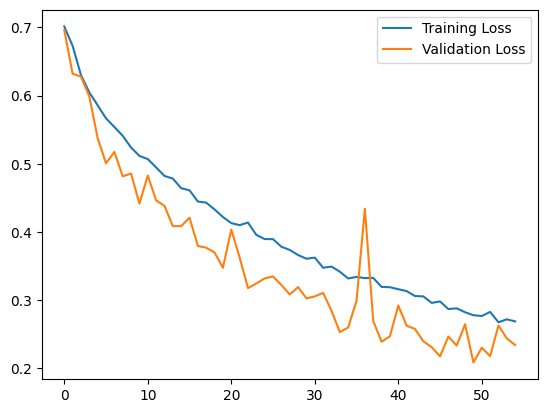

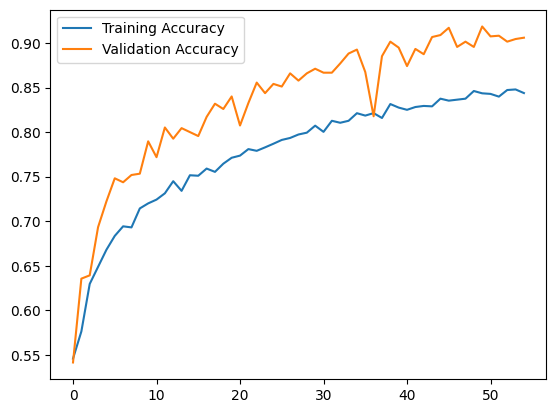

In [31]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()

In [32]:
# Evaluate the model
cvt_13.load_state_dict(torch.load('cvt_13_l_data.pth'))
cvt_13.to(device)

cvt_13.eval()
test_accuracy = 0
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    test_accuracy += (outputs.argmax(1) == labels).sum().item()
test_accuracy /= len(test_loader.dataset)
print(f'Test Accuracy: {test_accuracy:.4f}')

C:\Users\waiho\AppData\Local\Temp\ipykernel_10728\2481296272.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  cvt_13.load_state_dict(torch.load('cvt_13_l_data.pth'))


Test Accuracy: 0.9081


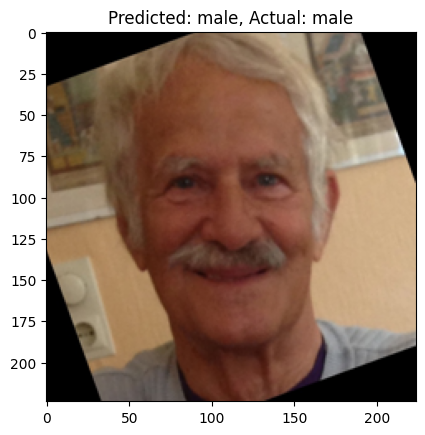

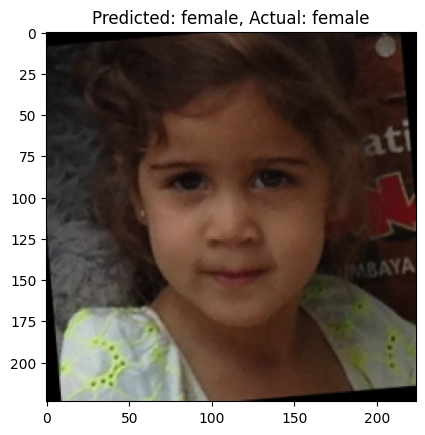

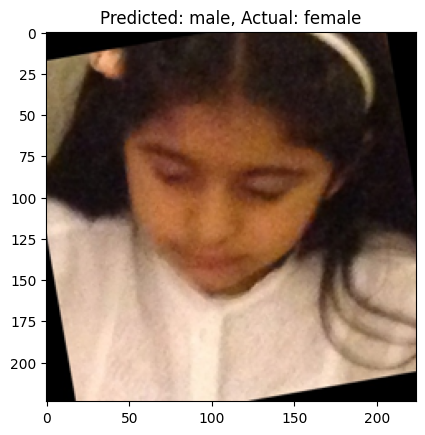

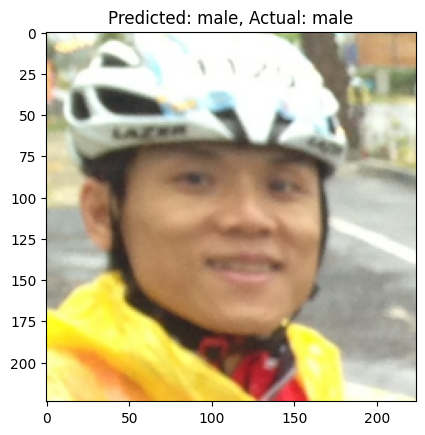

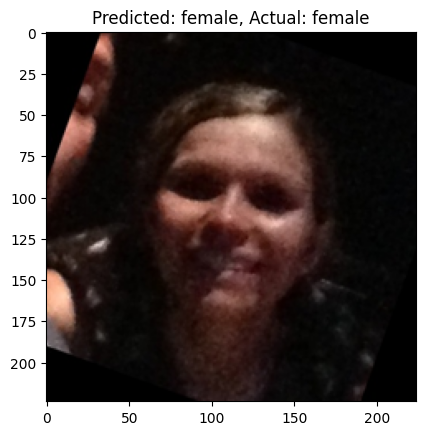

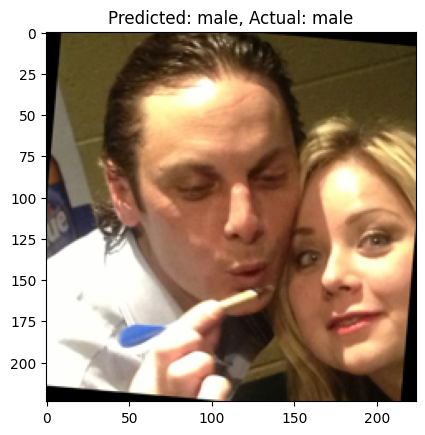

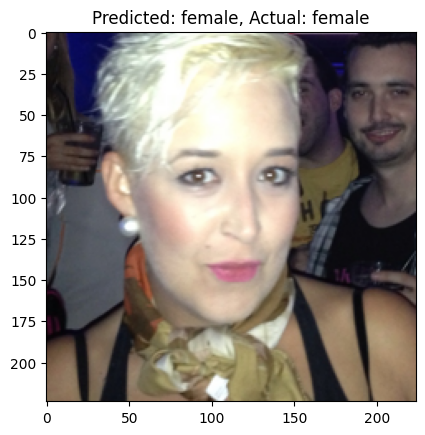

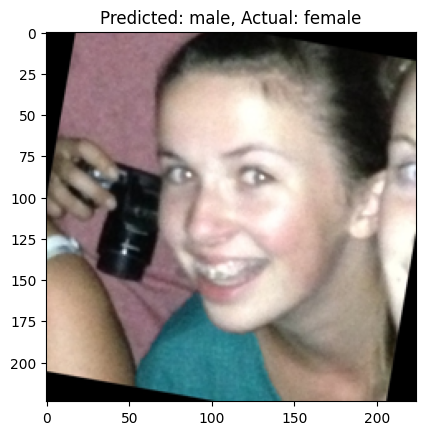

In [33]:
# Show some predictions
cvt_13.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
outputs = cvt_13(**inputs).logits
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()

### Transfer Learning

In [20]:
from transformers import CvtForImageClassification

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cvt_13 = CvtForImageClassification.from_pretrained("microsoft/cvt-13").to(device)


In [21]:
cvt_13

CvtForImageClassification(
  (cvt): CvtModel(
    (encoder): CvtEncoder(
      (stages): ModuleList(
        (0): CvtStage(
          (embedding): CvtEmbeddings(
            (convolution_embeddings): CvtConvEmbeddings(
              (projection): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(2, 2))
              (normalization): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
            )
            (dropout): Dropout(p=0.0, inplace=False)
          )
          (layers): Sequential(
            (0): CvtLayer(
              (attention): CvtAttention(
                (attention): CvtSelfAttention(
                  (convolution_projection_query): CvtSelfAttentionProjection(
                    (convolution_projection): CvtSelfAttentionConvProjection(
                      (convolution): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64, bias=False)
                      (normalization): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tra

In [22]:
# Check the number of parameters
total_params = sum([param.numel() for param in cvt_13.parameters()])
print(f'{total_params:,} total parameters.')

19,997,480 total parameters.


In [23]:
from transformers import AutoImageProcessor

# Load the image processor
image_processor = AutoImageProcessor.from_pretrained("microsoft/cvt-13")

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.48, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [24]:
image_processor

ConvNextImageProcessor {
  "crop_pct": 0.875,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "ConvNextImageProcessor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "shortest_edge": 224
  }
}

In [25]:
# Define the loss function and the optimizer
import torch.optim as optim

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(cvt_13.parameters(), lr=0.0001)

# Define early stopping
class EarlyStopper:
  def __init__(self, patience=5, min_delta=0.001):
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.min_loss = float('inf')

  def early_stop(self, loss):
    if loss < self.min_loss:
      self.min_loss = loss
      self.counter = 0
    elif loss > (self.min_loss + self.min_delta):
      self.counter += 1
      if self.counter >= self.patience:
        return True
    return False

early_stopper = EarlyStopper(patience=5, min_delta=0.001)

In [26]:
# Train the model
n_epochs = 100

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
min_val_loss = float('inf')

for epoch in range(n_epochs):
  print(f'===== Epoch {epoch+1} =====')
  train_loss = 0.0
  val_loss = 0.0
  train_accuracy = 0
  val_accuracy = 0

  # Training
  cvt_13.train()
  for images, labels in train_loader:
    images, labels = images.to(device), labels.to(device)
    optimizer.zero_grad()
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    train_accuracy += (outputs.argmax(1) == labels).sum().item()
  train_loss /= len(train_loader)
  train_losses.append(train_loss)
  train_accuracy /= len(train_loader.dataset)
  train_accuracies.append(train_accuracy)

  print(f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}')

  # Validation
  cvt_13.eval()
  with torch.no_grad():
    for images, labels in val_loader:
      images, labels = images.to(device), labels.to(device)
      inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
      outputs = cvt_13(**inputs).logits
      loss = criterion(outputs, labels)
      val_loss += loss.item()
      val_accuracy += (outputs.argmax(1) == labels).sum().item()
  val_loss /= len(val_loader)
  val_losses.append(val_loss)
  val_accuracy /= len(val_loader.dataset)
  val_accuracies.append(val_accuracy)

  # Save the best model
  if val_loss < min_val_loss:
    torch.save(cvt_13.state_dict(), 'cvt_13_finetune_l_data.pth')
    min_val_loss = val_loss

  # Early stopping
  if early_stopper.early_stop(val_loss):
    print('Early stopping')
    break

  print(f'Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}')

===== Epoch 1 =====
Training Loss: 1.0461, Training Accuracy: 0.6759
Validation Loss: 0.2353, Validation Accuracy: 0.8910
===== Epoch 2 =====
Training Loss: 0.4846, Training Accuracy: 0.7969
Validation Loss: 0.1751, Validation Accuracy: 0.9270
===== Epoch 3 =====
Training Loss: 0.4257, Training Accuracy: 0.8273
Validation Loss: 0.2028, Validation Accuracy: 0.9260
===== Epoch 4 =====
Training Loss: 0.3920, Training Accuracy: 0.8419
Validation Loss: 0.1569, Validation Accuracy: 0.9420
===== Epoch 5 =====
Training Loss: 0.3442, Training Accuracy: 0.8578
Validation Loss: 0.1304, Validation Accuracy: 0.9490
===== Epoch 6 =====
Training Loss: 0.3166, Training Accuracy: 0.8670
Validation Loss: 0.1488, Validation Accuracy: 0.9510
===== Epoch 7 =====
Training Loss: 0.3276, Training Accuracy: 0.8679
Validation Loss: 0.1238, Validation Accuracy: 0.9590
===== Epoch 8 =====
Training Loss: 0.2883, Training Accuracy: 0.8706
Validation Loss: 0.1021, Validation Accuracy: 0.9610
===== Epoch 9 =====
Trai

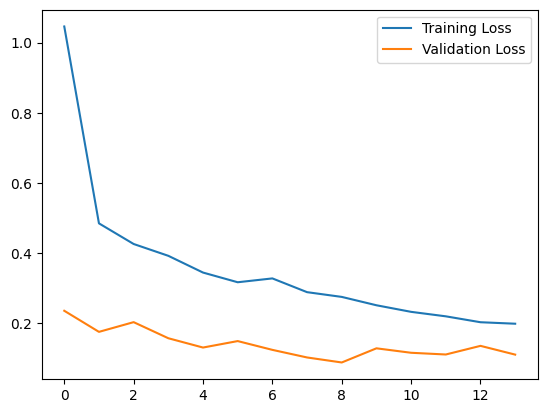

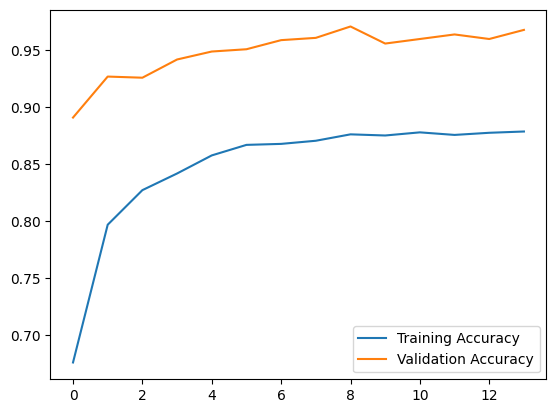

In [27]:
# Plot the losses and accuracies
import matplotlib.pyplot as plt

plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.legend()
plt.show()

plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.legend()
plt.show()

In [28]:
# Evaluate the model
cvt_13.load_state_dict(torch.load('cvt_13_finetune_l_data.pth'))
cvt_13.to(device)

cvt_13.eval()
test_accuracy = 0
with torch.no_grad():
  for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
    outputs = cvt_13(**inputs).logits
    test_accuracy += (outputs.argmax(1) == labels).sum().item()
test_accuracy /= len(test_loader.dataset)
print(f'Test Accuracy: {test_accuracy:.4f}')

C:\Users\waiho\AppData\Local\Temp\ipykernel_5152\2584850221.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  cvt_13.load_state_dict(torch.load('cvt_13_finetune_l_data.pth

Test Accuracy: 0.9640


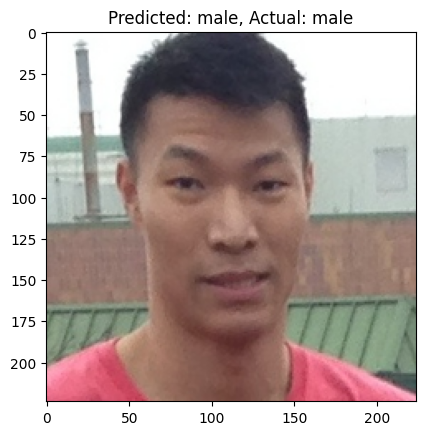

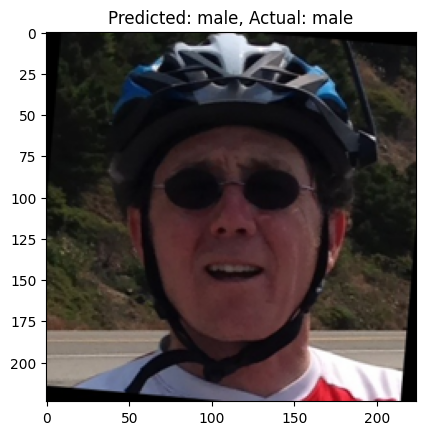

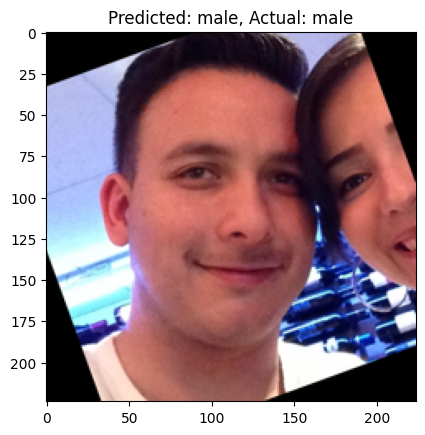

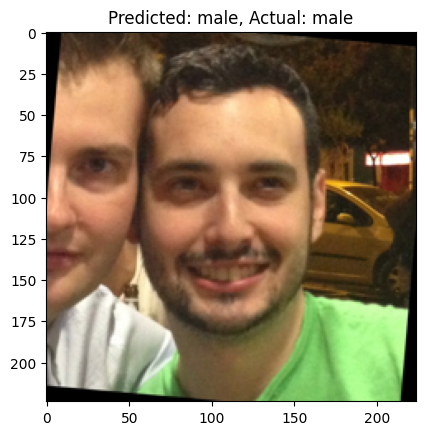

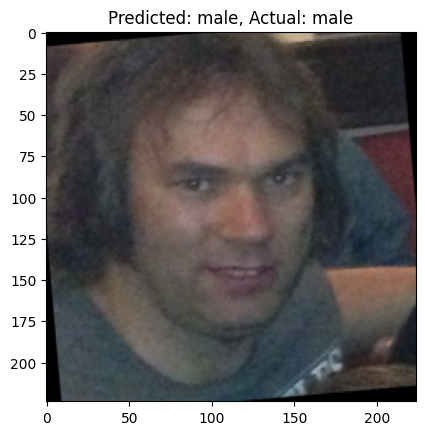

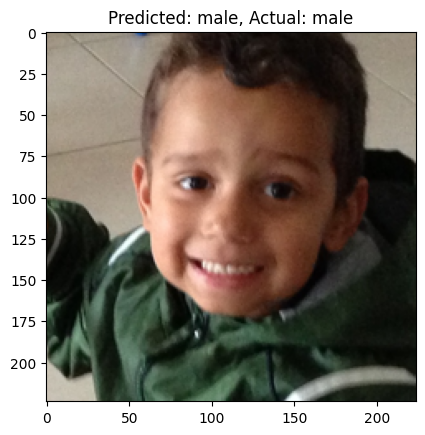

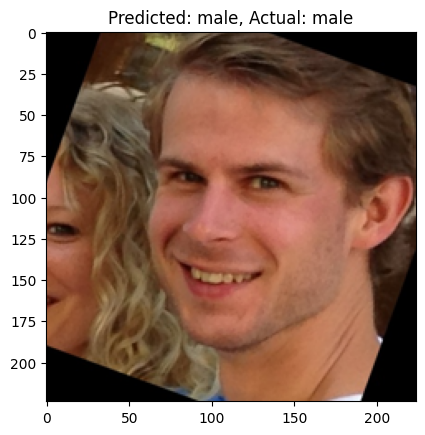

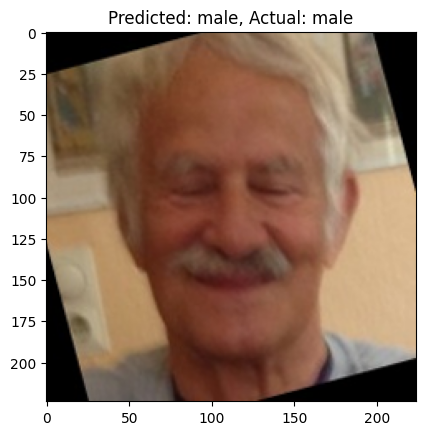

In [29]:
# Show some predictions
cvt_13.eval()
images, labels = next(iter(test_loader))
images, labels = images.to(device), labels.to(device)
inputs = image_processor(images, return_tensors="pt", do_rescale=False).to(device)
outputs = cvt_13(**inputs).logits
predicted = outputs.argmax(1)
for i in range(8):
  plt.imshow(images[i].cpu().permute(1, 2, 0))
  predicted_gender = id2label[predicted[i].item()]
  actual_gender = id2label[labels[i].item()]
  plt.title(f'Predicted: {predicted_gender}, Actual: {actual_gender}')
  plt.show()